In [8]:
import cv2
import numpy as np
from sklearn.feature_extraction import image
import matplotlib.pyplot as plt
from scipy.ndimage import shift
from tqdm import tqdm

#im,side = (cv2.imread("fluor.jpg"),20)
im,side = (cv2.imread("crystal.jpg"),17)
#im,side = (cv2.imread("lego_512.jpg"),17)
#im,side = (cv2.imread("chess.jpg"),17)

im[:,:,[2,1,0]] = im[:,:,[0,1,2]] #bgr to rgb
im = im/255 # normalize image
light_field = im

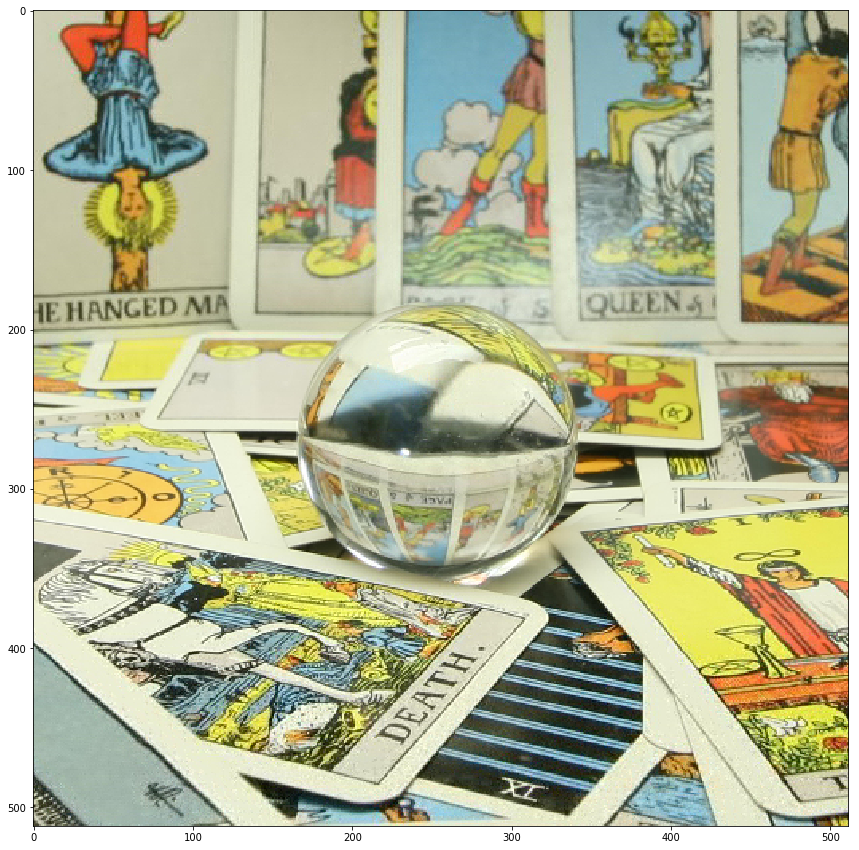

In [9]:
height,width,dim = light_field.shape
u,v = (8,8)
light_field_patch = light_field[u:-1:side,v:-1:side,:]

plt.figure(figsize = (15,15))
plt.imshow(light_field_patch)
plt.show()

In [10]:
rendered_height,rendered_width,dim = light_field_patch.shape

(inds,jnds) = np.mgrid[0:height:side,0:width:side]

radiance = np.zeros((rendered_height,rendered_width,side,side,3))

for u in tqdm(range(0,side)):
    for v in range(0,side):
        radiance[:,:,u,v] = light_field[inds+u,jnds+v]

100%|██████████| 17/17 [00:05<00:00,  3.47it/s]


In [11]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

slider_v = widgets.IntSlider(
    value=0,
    min=0,
    max=side-1,
    step=1,
    description='u:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

slider_u = widgets.IntSlider(
    value=0,
    min=0,
    max=side-1,
    step=1,
    description='v:',
    disabled=False,
    continuous_update=False,
    orientation='vertical',
    readout=True,
    readout_format='d'
)

slider_alpha = widgets.IntSlider(
    value=0,
    min=0,
    max=int(side/2),
    step=1,
    description='f-stop:',
)

slider_focus = widgets.FloatSlider(
    value=0,
    min=-2.0,
    max=2.0,
    step=0.05,
    description='C:'
)

def rendered_direction(u,v,returnVal = False):
    plt.figure(figsize = (13,13))
    plt.imshow(radiance[:,:,u,v])
    if returnVal:
        return radiance[:,:,u,v]
    
"""Pixel location in microlens image gives (u,v) coord"""
def rendered_focus(C,returnVal = False):
    rendered = np.zeros((rendered_height,rendered_width,3))
    center_uv = int(side/2)
    for u in tqdm(range(0, side)):
        for v in range(0, side):
            shift_x,shift_y = C*(center_uv-u),C*(center_uv-v)
            rendered[:,:] += shift(radiance[:,:,u,v],(shift_x,shift_y,0))
    final = rendered / (side*side)
    plt.figure(figsize = (15,15))
    plt.imshow(final)
    if returnVal:
        return final
    
def rendered_aperture(alpha,returnVal = False):
    rendered = np.zeros((rendered_height,rendered_width,3))
    for u in tqdm(range(alpha, side-alpha)):
        for v in range(alpha, side-alpha):
            rendered[:,:] += radiance[:,:,u,v]
    final = rendered / ((side-2*alpha) * (side-2*alpha))
    plt.figure(figsize = (15,15))
    plt.imshow(final)
    if returnVal:
        return final

In [5]:
interact(rendered_direction, u=slider_u,v=slider_v)

interactive(children=(IntSlider(value=0, continuous_update=False, description='v:', max=16, orientation='verti…

<function __main__.rendered_direction(u, v, returnVal=False)>

In [6]:
interact(rendered_aperture,alpha=slider_alpha)

interactive(children=(IntSlider(value=0, description='f-stop:', max=8), Checkbox(value=False, description='ret…

<function __main__.rendered_aperture(alpha, returnVal=False)>

In [ ]:
# Use this one with caution! This can take a lot of time depending on the size of the image rendered
rendered_focus(C=0.1)

100%|██████████| 17/17 [02:16<00:00,  8.01s/it]
/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
100%|██████████| 17/17 [02:26<00:00,  8.87s/it]


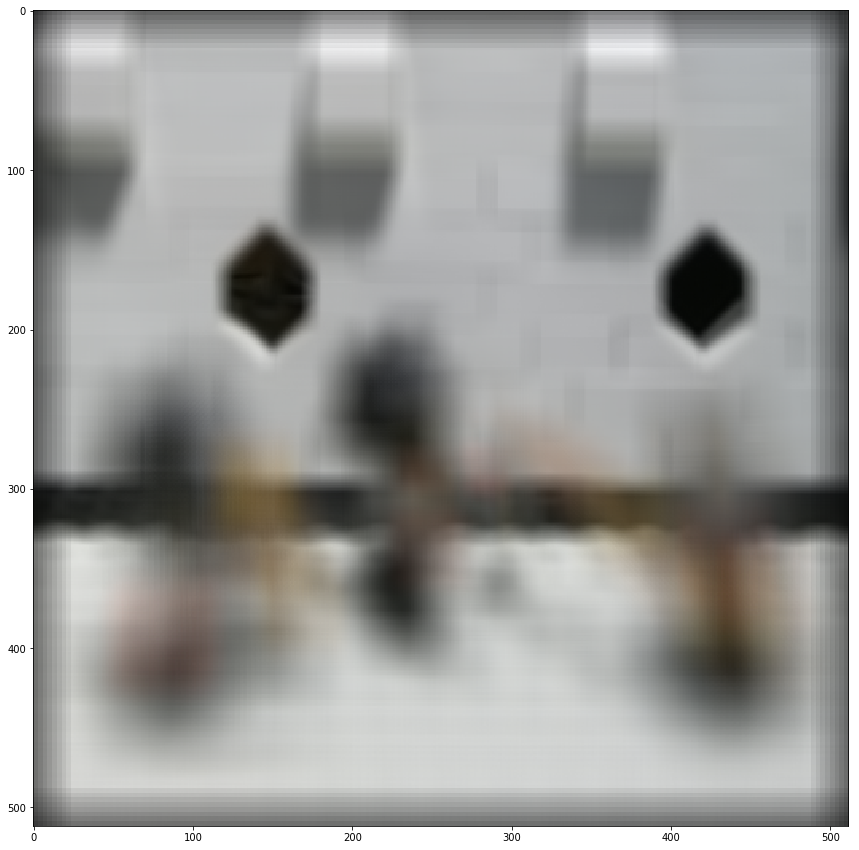

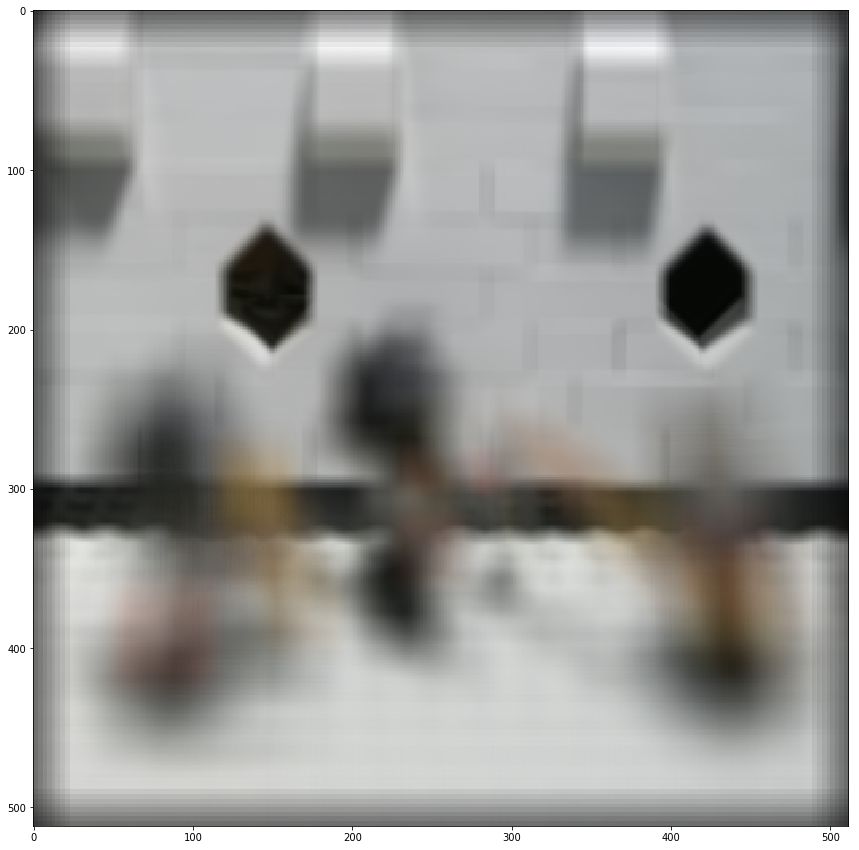

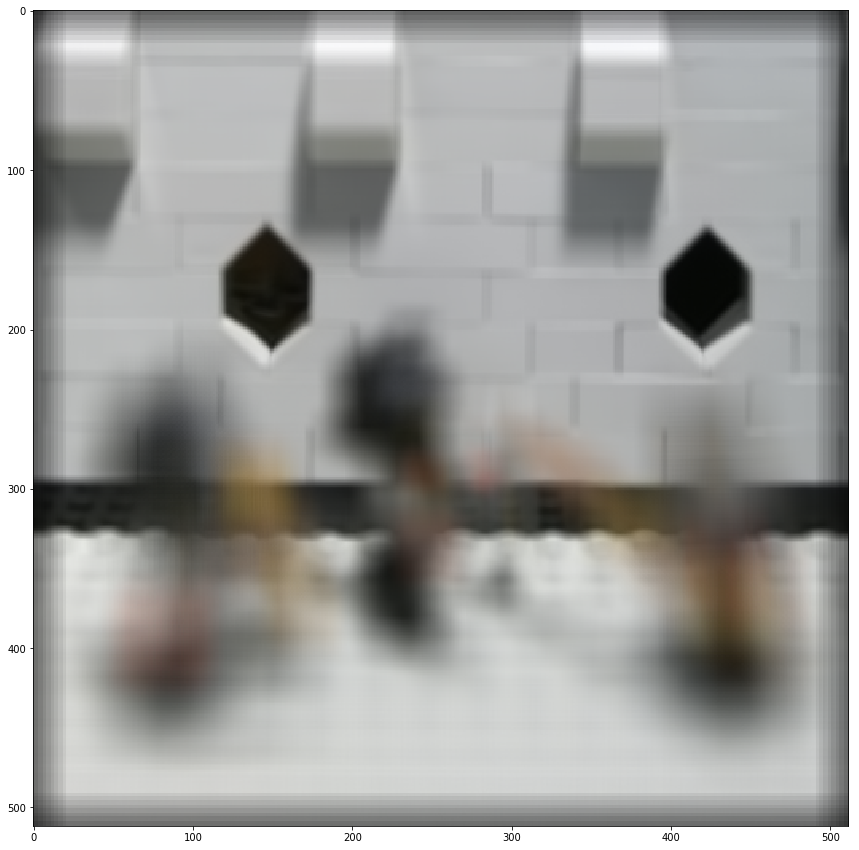

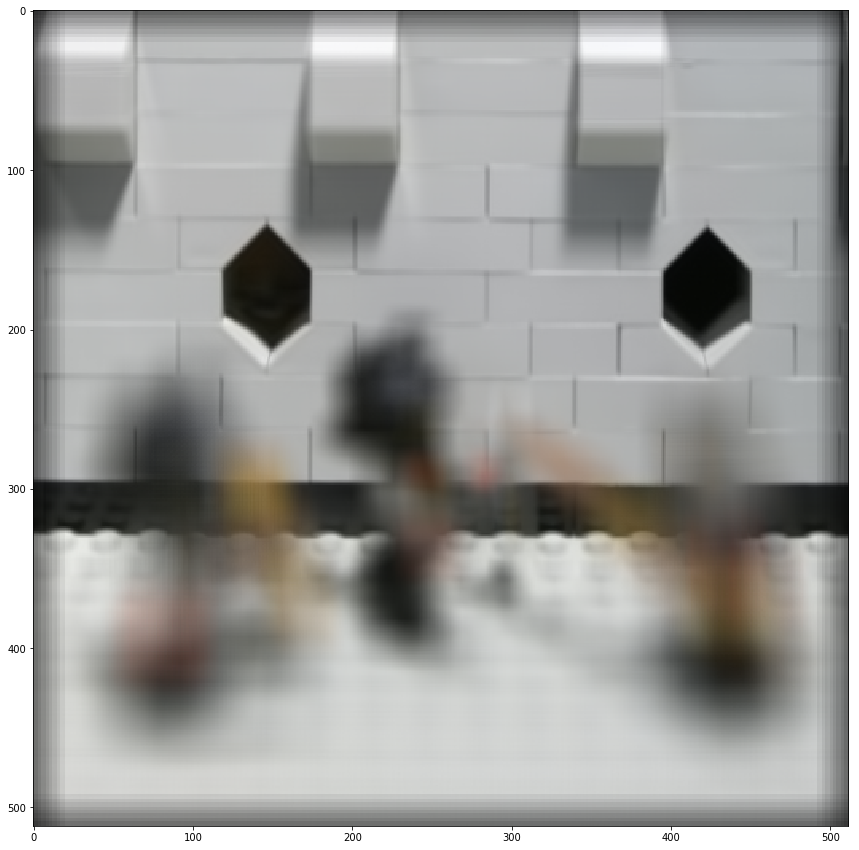

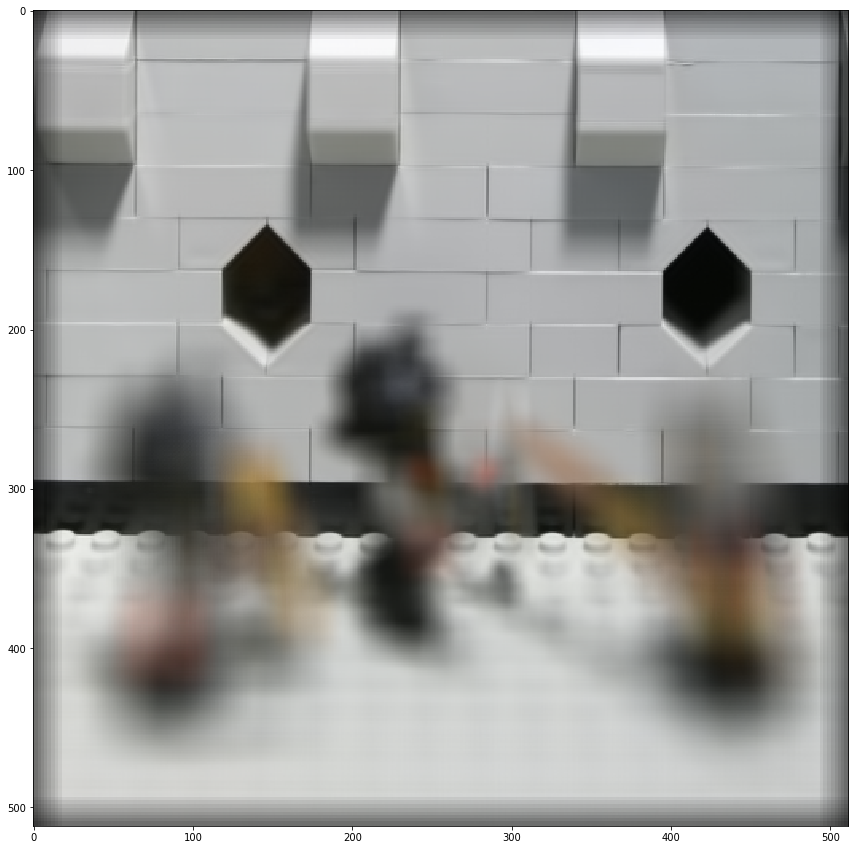

...

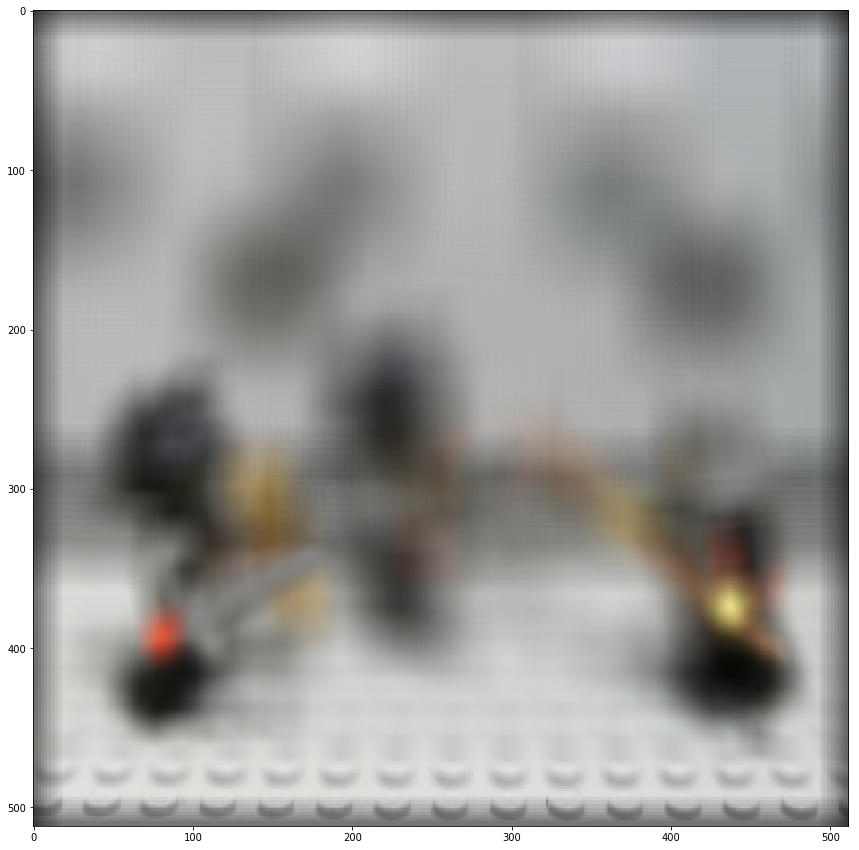

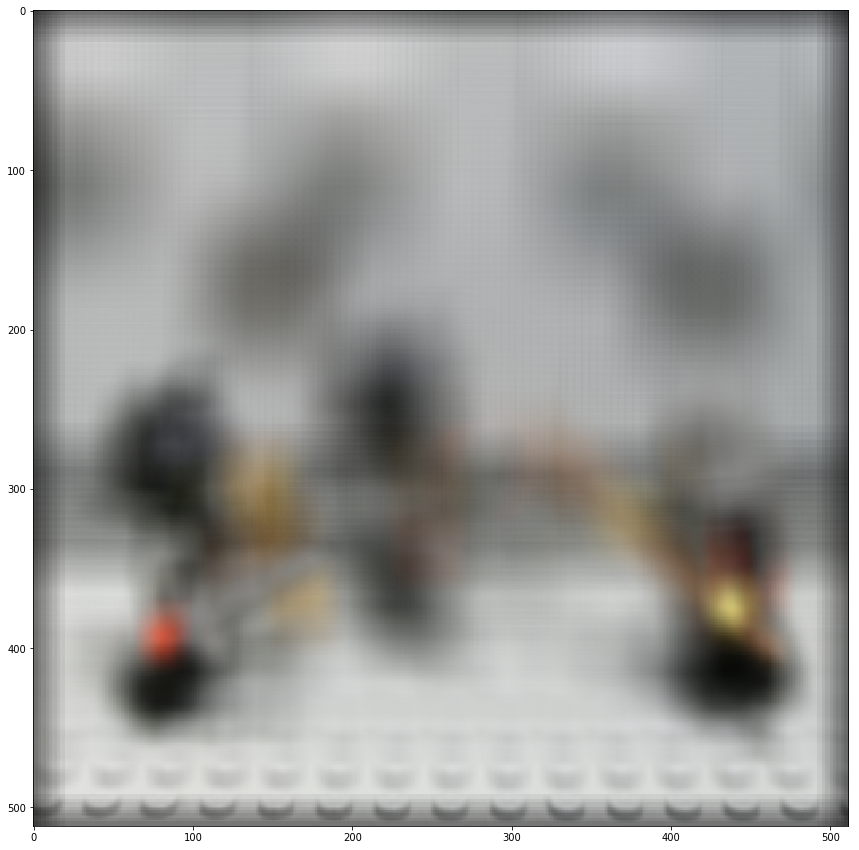

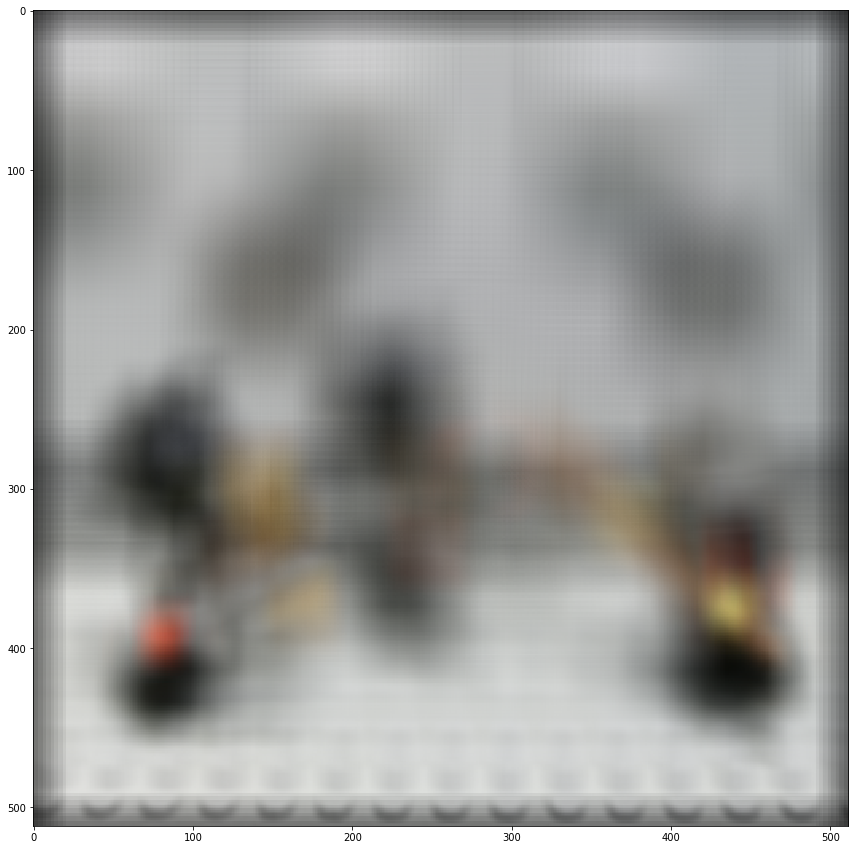

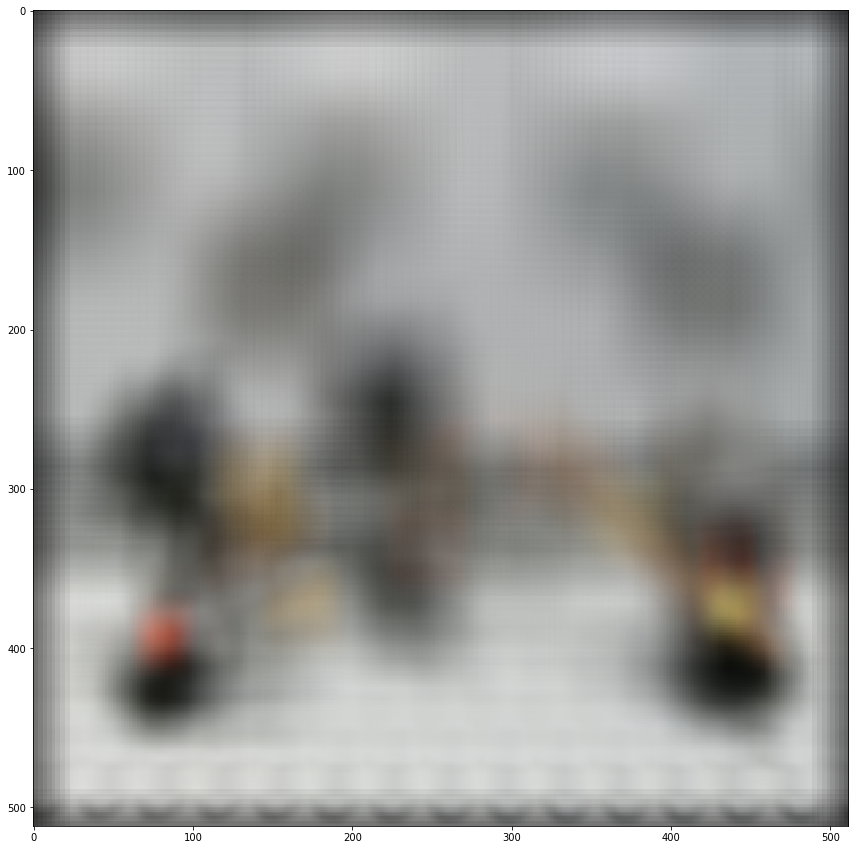

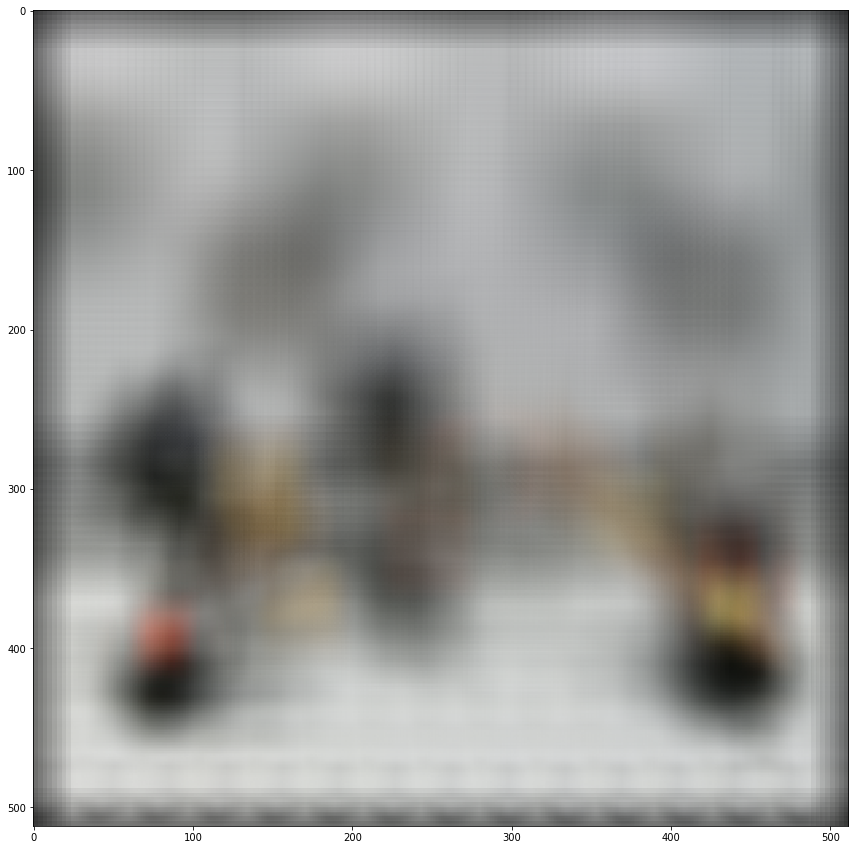

In [7]:
# Write the refocused images to a gif file (THIS TAKE LONG TIME)
import imageio
from PIL import Image

cs = np.linspace(-3,3,30)

with imageio.get_writer('refocused.gif', mode='I') as writer:
    for c in cs:
        refocused = rendered_focus(C=c,returnVal=True)
        imageio.imwrite('temp.png', refocused)
        image = imageio.imread('temp.png')
        writer.append_data(image)


100%|██████████| 17/17 [00:03<00:00,  5.36it/s]WARNING:root:Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.

100%|██████████| 15/15 [00:02<00:00,  5.74it/s]WARNING:root:Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.

100%|██████████| 13/13 [00:02<00:00,  6.63it/s]WARNING:root:Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.

100%|██████████| 11/11 [00:01<00:00,  8.04it/s]WARNING:root:Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.

100%|██████████| 9/9 [00:01<00:00,  8.28it/s]WARNING:root:Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.

100%|██████████| 7/7 [00:00<00:00, 12.26it/s]WARNING:root:Lossy conversion from float64 to uint8. Ran

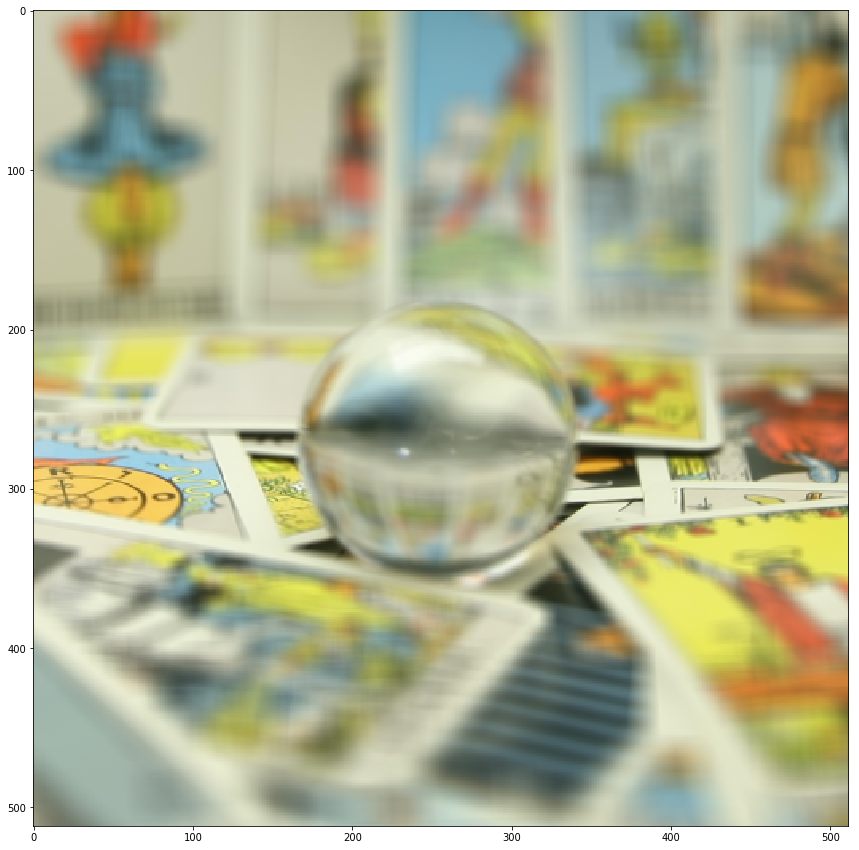

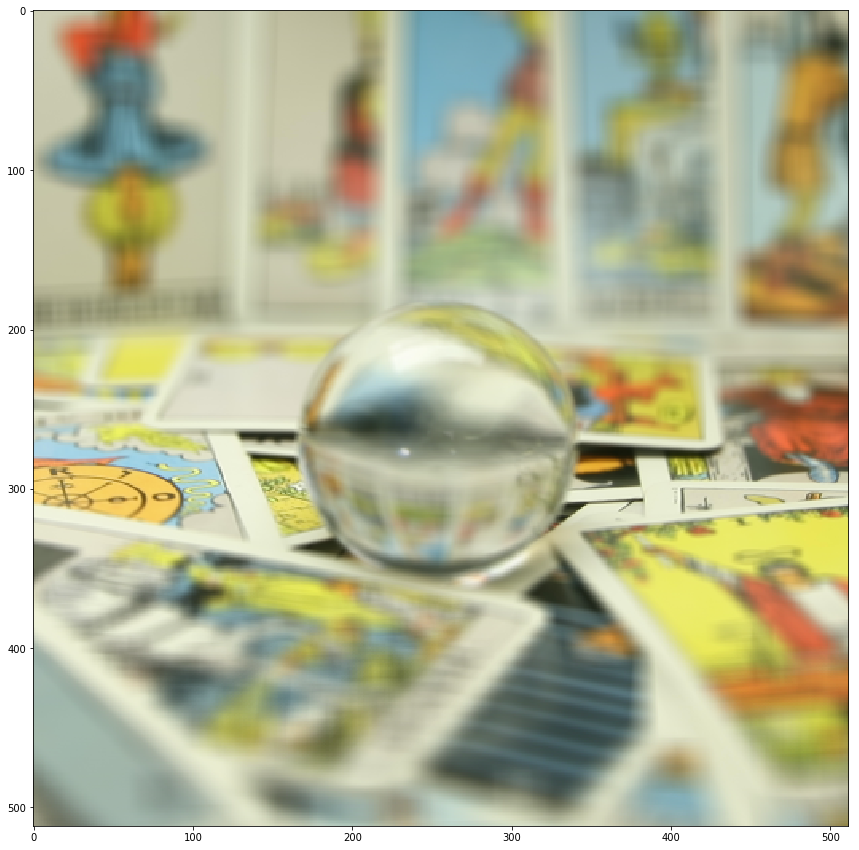

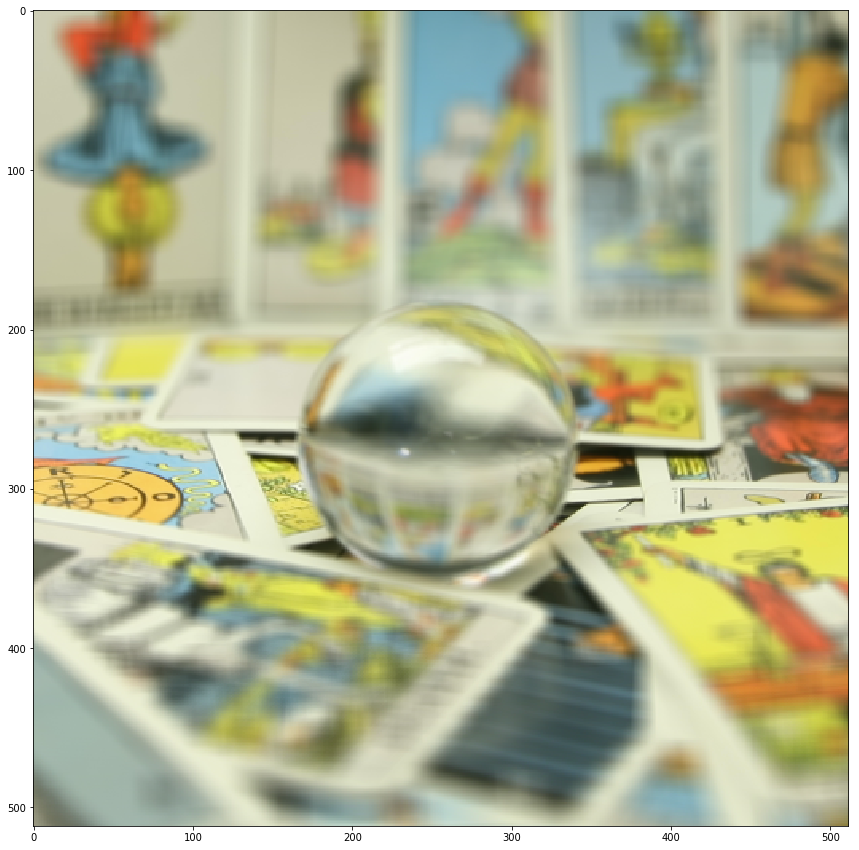

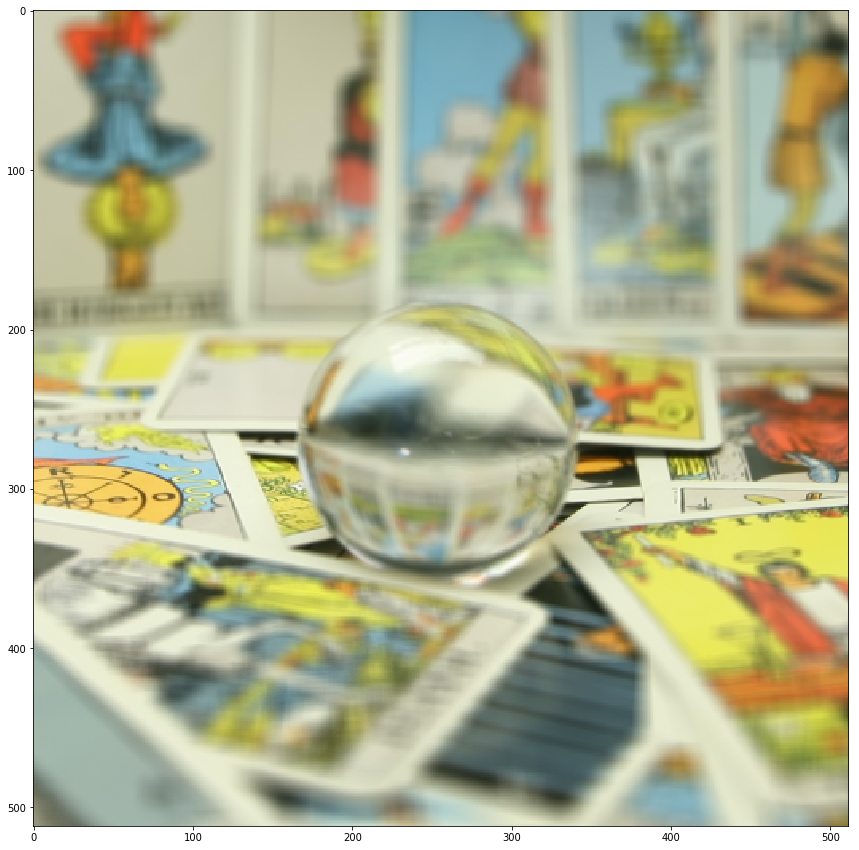

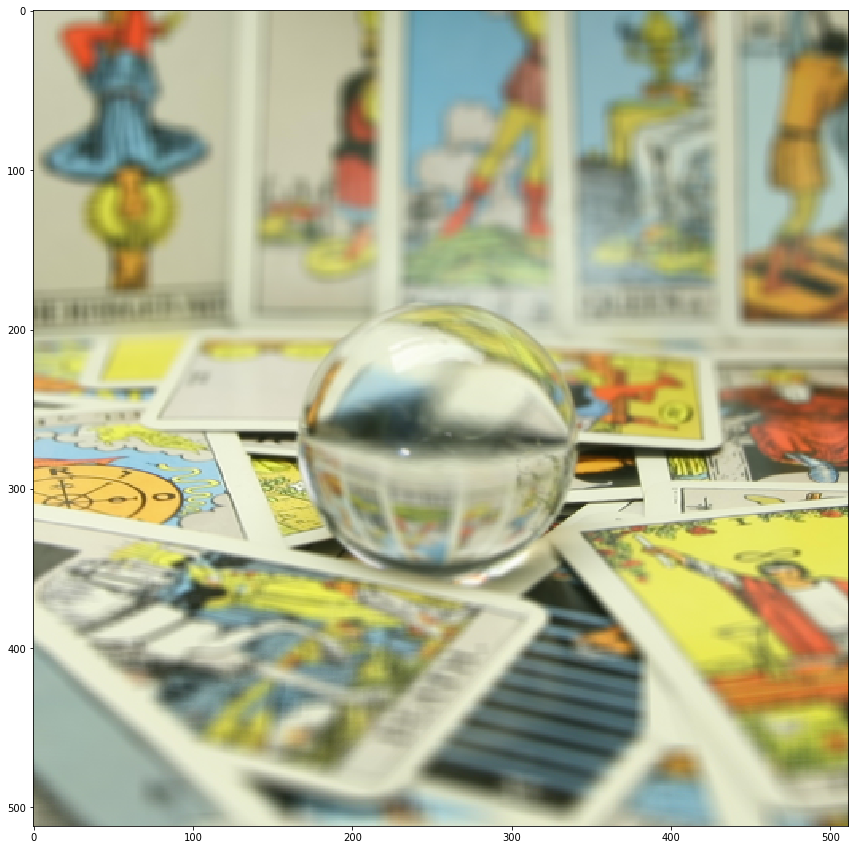

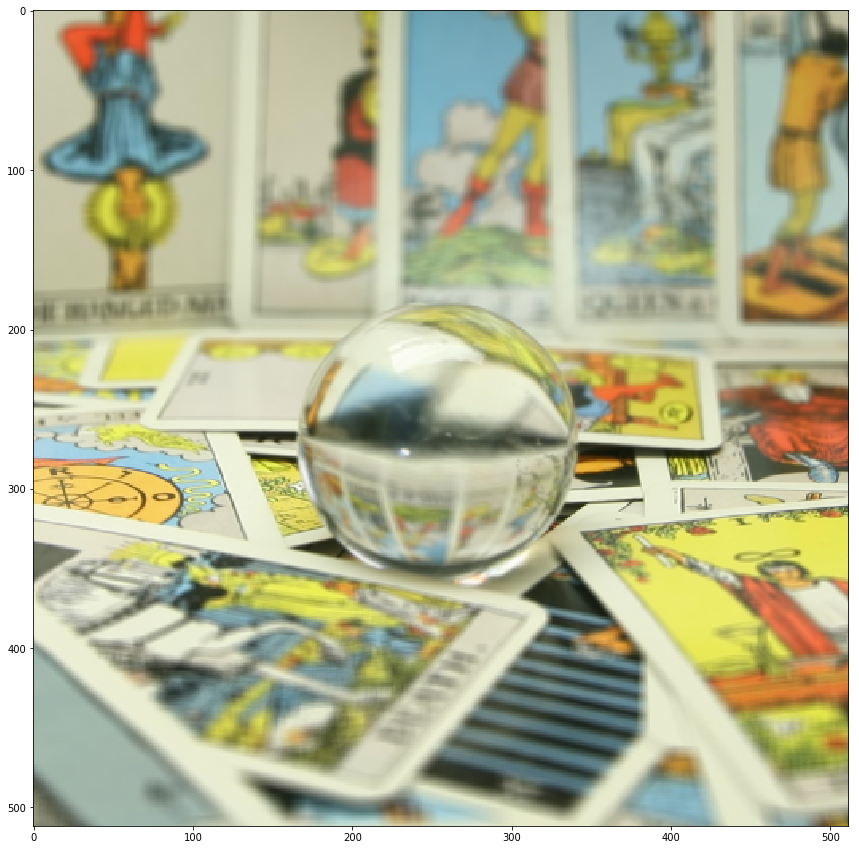

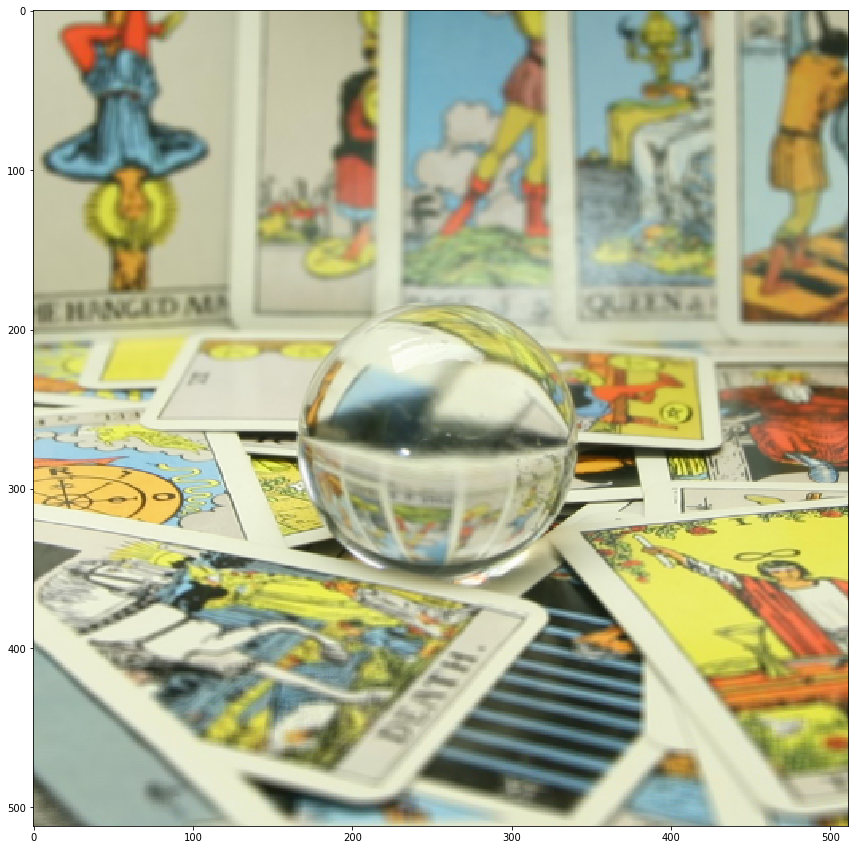

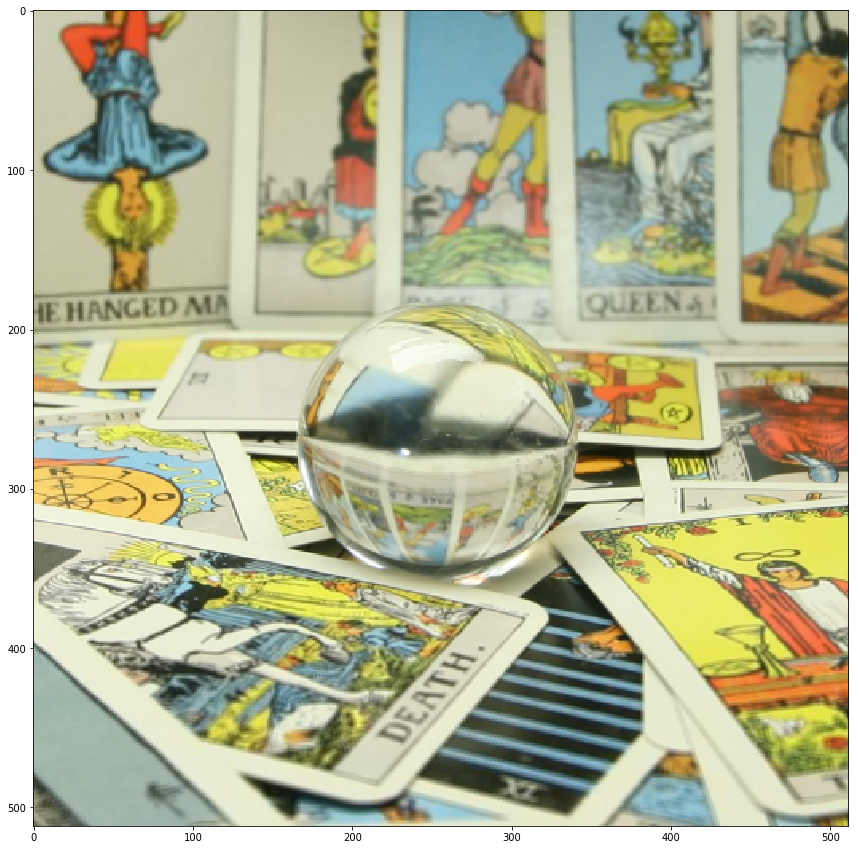

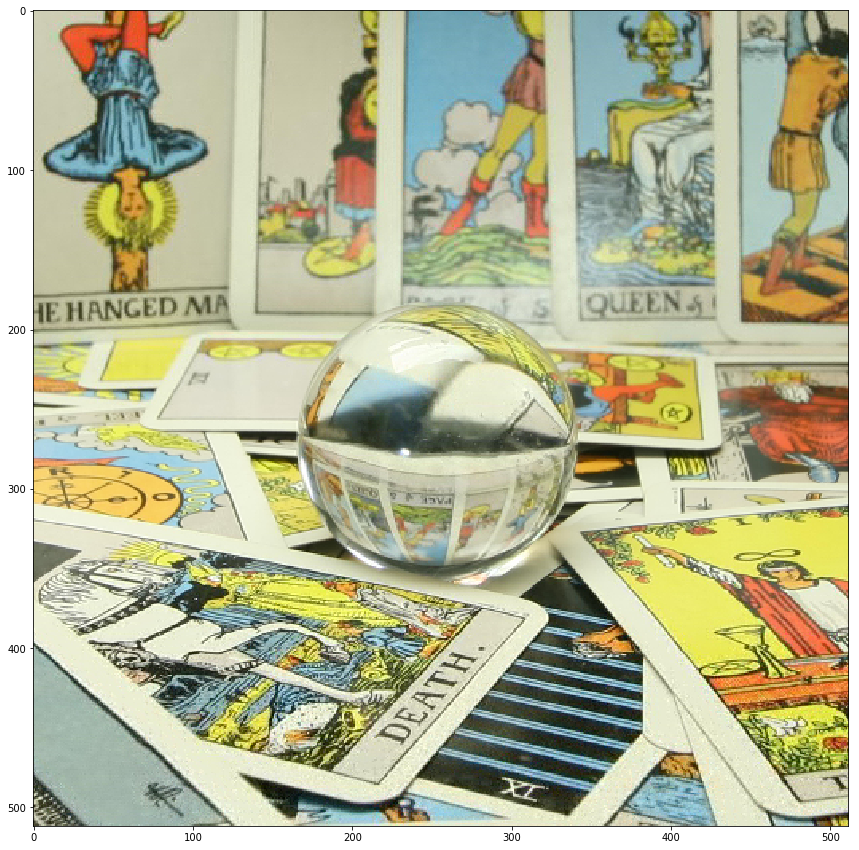

In [14]:
# Aperture changes
import imageio
from PIL import Image

fstop = np.arange(9)

with imageio.get_writer('aperture.gif', mode='I',fps=10) as writer:
    for stop in fstop:
        refocused = rendered_aperture(alpha=stop,returnVal=True)
        imageio.imwrite('temp.png', refocused)
        image = imageio.imread('temp.png')
        writer.append_data(image)